In [1]:
import nltk
import pandas as pd
import pathlib as pl
from subjetividades import *
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from nltk.corpus import stopwords
from pathlib import Path
from collections import Counter

In [2]:

nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hamso\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [3]:
current_path    = pl.Path.cwd().parent
output_folders  = create_output_directories(current_path)
data_folders    = create_data_directories(output_folders[0])
docs_list       = list(data_folders[0].glob('*.xlsx'))
images_folder   = output_folders[1].joinpath('images')
images_folder.mkdir(exist_ok=True)

docs_list[0]

WindowsPath('d:/Repositorios/Vanessa - subjetividades/subjetividades-politicas/data/raw/2. filtrada respuestas_prediccion_completo.xlsx')

In [4]:
df = pd.read_excel(docs_list[0])
df.head()

,NOMBRE,P3,Prediccion a la pregunta P3,Subcategoria a la pregunta P3,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P3,P4,Prediccion a la pregunta P4,Subcategoria a la pregunta P4,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P4,P5,...,Subcategoria a la pregunta P41,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P41,P42,Prediccion a la pregunta P42,Subcategoria a la pregunta P42,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P42,P43,Prediccion a la pregunta P43,Subcategoria a la pregunta P43,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P43
0,Brandon Santos,"Total, total. Cada... Es evidente, y se siente...",POLARIZACIÓN,NaN,NaN,"Bueno, pues, ¿qué considero yo? Hombre, la pol...",POLARIZACIÓN,NaN,NaN,"""Hombre, la política está muy polarizada hoy e...",...,NaN,NaN,NaN,NaN,NaN,NaN,"No, obviamente en el de Uribe. Pero en la actu...",POLARIZACIÓN,NaN,NaN
1,Michael Patton,¿La polarización? En eso estamos desde hace má...,POLARIZACIÓN,NaN,NaN,En eso estamos desde hace más de diez años. De...,POLARIZACIÓN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,¿La polarización? En eso estamos desde hace má...,POLARIZACIÓN,NaN,NaN
2,Dennis Kennedy,NaN,NaN,NaN,NaN,"En estos gobiernos que has mencionado, ¿cómo m...",EMOCIONES POLÍTICAS,PRIMARIA,NaN,en este oportunidad si escuche un discurso y d...,...,NaN,NaN,"No me considero de ninguna, pues en algún mome...",IDENTIDAD,INDIVIDUAL,NaN,"no, para nada, eso es lo que nos quieren hacer...",POLARIZACIÓN,NaN,NaN
3,Wanda Gray,Hay unas recámaras que resuenan con una inform...,POLARIZACIÓN,NaN,NaN,"La salud más bien mal. Bueno, más bien no se h...",EMOCIONES POLÍTICAS,PRIMARIA,NaN,NaN,...,SOCIAL,REAL,Es difícil llegar a un punto medio otra vez. P...,POLARIZACIÓN,NaN,NaN,Y es impresionante la cantidad de personas que...,POLARIZACIÓN,NaN,NaN
4,Anna Roy,"no, está muy polarizado y yo en lo que en lo q...",POLARIZACIÓN,NaN,NaN,NaN,NaN,NaN,NaN,"Yo sería partidario, como le digo, de que ese ...",...,SOCIAL,REAL,NaN,NaN,NaN,NaN,está muy polarizado y yo en lo que en lo que l...,POLARIZACIÓN,NaN,NaN


In [5]:
lista_categorias = []
for i in range(1,45):
    lista_categorias.append(f'Prediccion a la pregunta P{i}')

# Eliminar los elementos especificados
lista_categorias.remove('Prediccion a la pregunta P1')
lista_categorias.remove('Prediccion a la pregunta P2')
lista_categorias.remove('Prediccion a la pregunta P9')
lista_categorias.remove('Prediccion a la pregunta P10')
lista_categorias.remove('Prediccion a la pregunta P19')
lista_categorias.remove('Prediccion a la pregunta P23')
lista_categorias.remove('Prediccion a la pregunta P24')
lista_categorias.remove('Prediccion a la pregunta P29')
lista_categorias.remove('Prediccion a la pregunta P30')
lista_categorias.remove('Prediccion a la pregunta P37')
lista_categorias.remove('Prediccion a la pregunta P38')
lista_categorias.remove('Prediccion a la pregunta P44')

lista_categorias

['Prediccion a la pregunta P3',
 'Prediccion a la pregunta P4',
 'Prediccion a la pregunta P5',
 'Prediccion a la pregunta P6',
 'Prediccion a la pregunta P7',
 'Prediccion a la pregunta P8',
 'Prediccion a la pregunta P11',
 'Prediccion a la pregunta P12',
 'Prediccion a la pregunta P13',
 'Prediccion a la pregunta P14',
 'Prediccion a la pregunta P15',
 'Prediccion a la pregunta P16',
 'Prediccion a la pregunta P17',
 'Prediccion a la pregunta P18',
 'Prediccion a la pregunta P20',
 'Prediccion a la pregunta P21',
 'Prediccion a la pregunta P22',
 'Prediccion a la pregunta P25',
 'Prediccion a la pregunta P26',
 'Prediccion a la pregunta P27',
 'Prediccion a la pregunta P28',
 'Prediccion a la pregunta P31',
 'Prediccion a la pregunta P32',
 'Prediccion a la pregunta P33',
 'Prediccion a la pregunta P34',
 'Prediccion a la pregunta P35',
 'Prediccion a la pregunta P36',
 'Prediccion a la pregunta P39',
 'Prediccion a la pregunta P40',
 'Prediccion a la pregunta P41',
 'Prediccion a l

In [6]:

for col in lista_categorias:
    #Replace the nan values in the column col with the word 'NINGUNA',use fillna() method
    df[col] = df[col].fillna('NINGUNA')
    # df[col] = df[col].replace('NaN', 'NINGUNA')

In [7]:
lista = []
for i in range(1,45):
    lista.append(f'P{i}')

lista.remove('P1')
lista.remove('P2')
lista.remove('P9')
lista.remove('P10')
lista.remove('P19')
lista.remove('P23')
lista.remove('P24')
lista.remove('P29')
lista.remove('P30')
lista.remove('P37')
lista.remove('P38')
lista.remove('P44')

# lista_categorias.remove('Prediccion a la pregunta P38')
# lista_categorias.remove('Prediccion a la pregunta P44')

lista


['P3',
 'P4',
 'P5',
 'P6',
 'P7',
 'P8',
 'P11',
 'P12',
 'P13',
 'P14',
 'P15',
 'P16',
 'P17',
 'P18',
 'P20',
 'P21',
 'P22',
 'P25',
 'P26',
 'P27',
 'P28',
 'P31',
 'P32',
 'P33',
 'P34',
 'P35',
 'P36',
 'P39',
 'P40',
 'P41',
 'P42',
 'P43']

In [8]:

# for col in lista:
#     #Replace the nan values in the column 'col' with 'NINGUNA'
#     df[col] = df[col].replace('nan', 'NINGUNA')


graficas_columnas = df.columns
graficas_columnas = graficas_columnas.difference(lista)
# quiero hacer un drop de la columna nombre en la lista graficas_columnas
graficas_columnas = graficas_columnas.drop('NOMBRE')
graficas_columnas

Index(['Prediccion a la pregunta P11', 'Prediccion a la pregunta P12',
       'Prediccion a la pregunta P13', 'Prediccion a la pregunta P14',
       'Prediccion a la pregunta P15', 'Prediccion a la pregunta P16',
       'Prediccion a la pregunta P17', 'Prediccion a la pregunta P18',
       'Prediccion a la pregunta P20', 'Prediccion a la pregunta P21',
       'Prediccion a la pregunta P22', 'Prediccion a la pregunta P25',
       'Prediccion a la pregunta P26', 'Prediccion a la pregunta P27',
       'Prediccion a la pregunta P28', 'Prediccion a la pregunta P3',
       'Prediccion a la pregunta P31', 'Prediccion a la pregunta P32',
       'Prediccion a la pregunta P33', 'Prediccion a la pregunta P34',
       'Prediccion a la pregunta P35', 'Prediccion a la pregunta P36',
       'Prediccion a la pregunta P39', 'Prediccion a la pregunta P4',
       'Prediccion a la pregunta P40', 'Prediccion a la pregunta P41',
       'Prediccion a la pregunta P42', 'Prediccion a la pregunta P43',
       '

In [9]:
lista_rara = []
for col in graficas_columnas:
    if df[col].dtype == 'object':  # Verificar si la columna es de tipo string
        df[col] = df[col].str.strip().str.upper()
        create_bar_chart(df, col, col, col, images_folder, False)
        create_pie_chart(df, col, col, col, images_folder, False)
    else:
        print(f"La columna {col} no es de tipo string y se omitirá.")
        lista_rara.append(col)

La columna Subcategoria a la pregunta P3 no es de tipo string y se omitirá.
La columna Subcategoria a la pregunta P43 no es de tipo string y se omitirá.
La columna Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P11 no es de tipo string y se omitirá.
La columna Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P12 no es de tipo string y se omitirá.
La columna Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P13 no es de tipo string y se omitirá.
La columna Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P3 no es de tipo string y se omitirá.
La columna Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P35 no es de tipo string y se omitirá.
La columna Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P4 no es de tipo string y se omitirá.
La columna Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P40 no es de tipo string y se omitirá.
La columna Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P42 no es de tipo string y se omitirá.
La columna Subsubcategoria (IDENTIDAD SOCIAL) a la pregun

In [10]:
# create a new dataset with the columns that are in lista_rara based on df dataframe
df_new = df[lista_rara]
df_new.head(20)

,Subcategoria a la pregunta P3,Subcategoria a la pregunta P43,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P11,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P12,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P13,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P3,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P35,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P4,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P40,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P42,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P43,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P5
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
lista_rara

['Subcategoria a la pregunta P3',
 'Subcategoria a la pregunta P43',
 'Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P11',
 'Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P12',
 'Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P13',
 'Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P3',
 'Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P35',
 'Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P4',
 'Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P40',
 'Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P42',
 'Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P43',
 'Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P5']

# Nubes de palabras

In [12]:
def create_wordcloud(df, column, output_path, dpi=300, palabras_excluidas=None):
    """
    Create a word cloud based on the text in the specified column of the dataframe.

    Parameters:
    - df (DataFrame): The DataFrame containing the text data.
    - column (str): The column in the dataframe containing the text data.
    - output_path (Path): The path for the output image folder.
    - dpi (int): The resolution of the output image in dots per inch. Default is 300.
    - palabras_excluidas (list): List of words to be excluded from the word cloud.

    Returns:
    - None
    """
    grouped_column = df[column].tolist()
    grouped_column = [str(text) for text in grouped_column if str(text) != 'nan']
    # Get the Spanish stopwords
    spanish_stopwords = stopwords.words('spanish')
    # Add additional excluded words
    if palabras_excluidas:
        spanish_stopwords.extend(palabras_excluidas)
    # Convert the column values to a single text
    text = ' '.join(grouped_column)
    # Create the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white')
    # Add the stopwords to the WordCloud
    wordcloud.stopwords.update(spanish_stopwords)
    wordcloud.generate(text)

    # Obtener las frecuencias de las palabras
    frequencies = wordcloud.words_

    # Ordenar las palabras por frecuencia y obtener las 10 más frecuentes
    top_10_words = Counter(frequencies).most_common(10)

    # Guardar las 10 palabras más frecuentes en un archivo de texto
    output_file_txt = output_path / f'wordcloud_{column}_top_10_words.txt'
    with open(output_file_txt, 'w', encoding='utf-8') as file:
        file.write("Top 10 palabras más frecuentes en la nube de palabras:\n")
        for word, frequency in top_10_words:
            file.write(f"{word}: {frequency}\n")

    # Save the word cloud image
    output_file = output_path / f'wordcloud_{column}.png'
    wordcloud.to_image().save(str(output_file), format='png', dpi=(dpi, dpi))
    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

Creando wordcloud para la columna P3


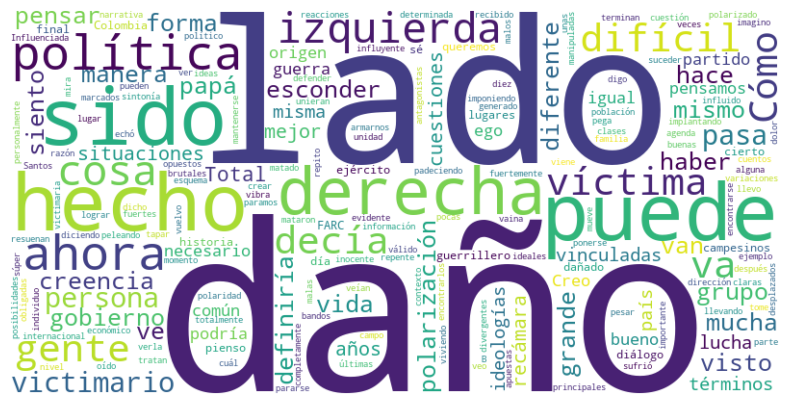

Creando wordcloud para la columna P4


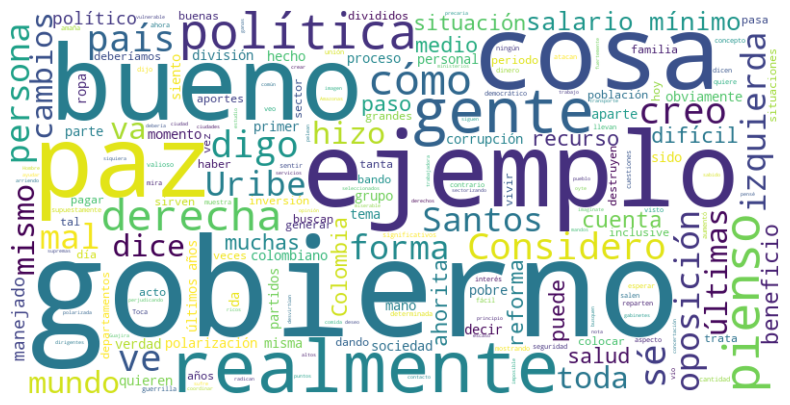

Creando wordcloud para la columna P5


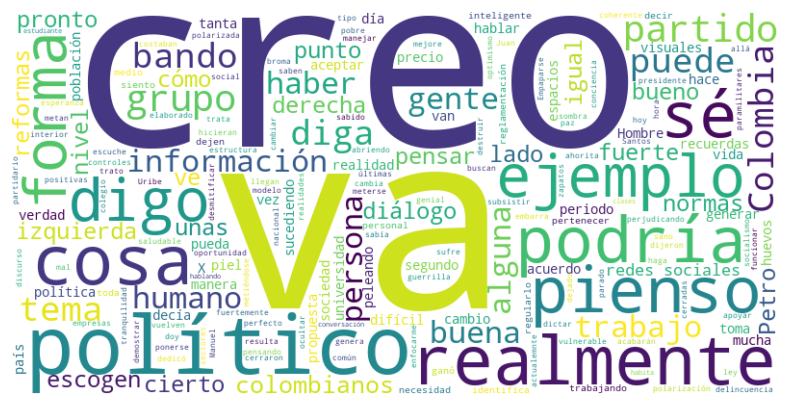

Creando wordcloud para la columna P6


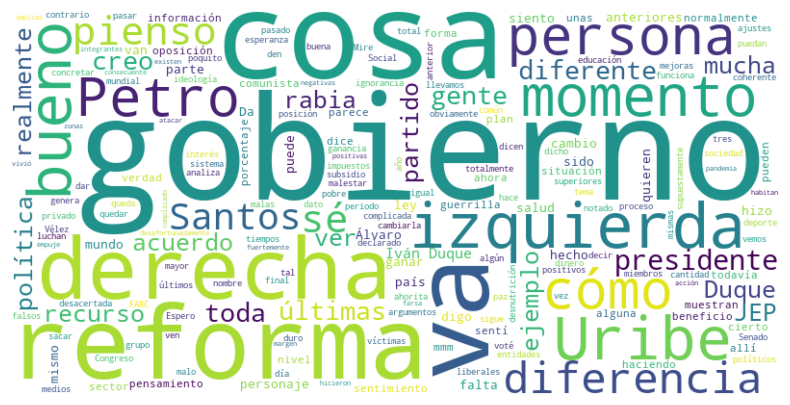

Creando wordcloud para la columna P7


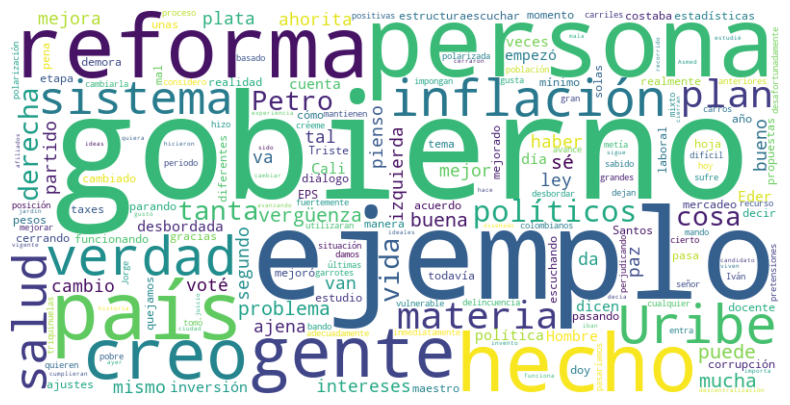

Creando wordcloud para la columna P8


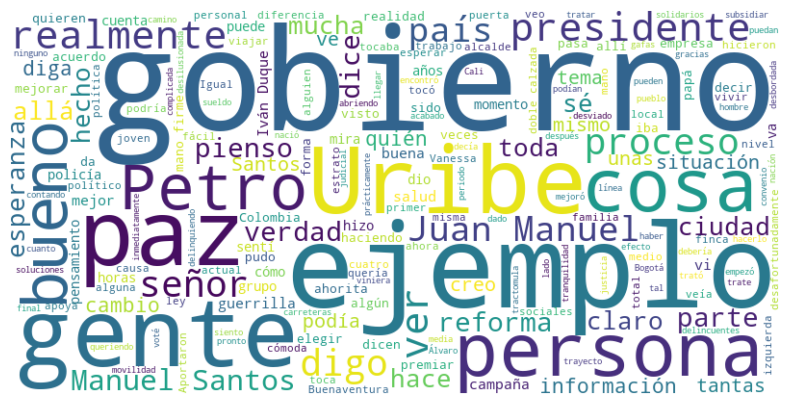

Creando wordcloud para la columna P11


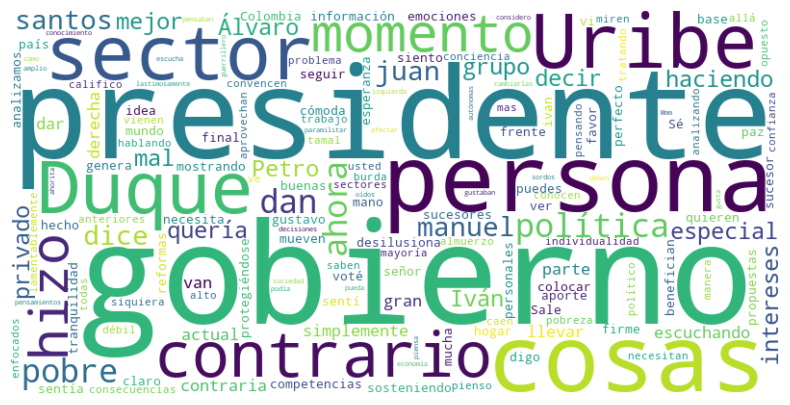

Creando wordcloud para la columna P12


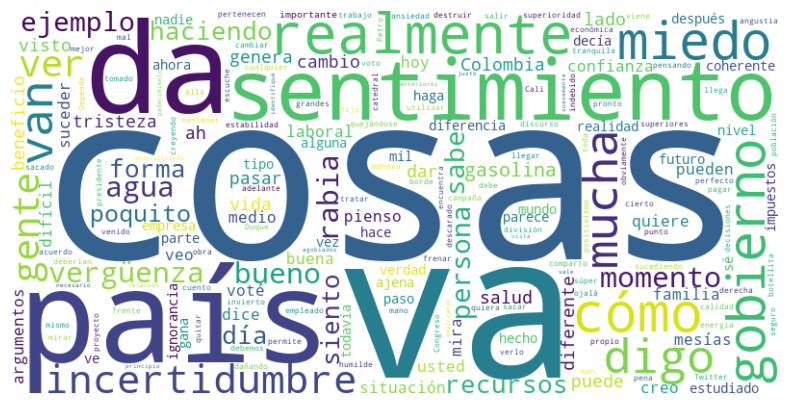

Creando wordcloud para la columna P13


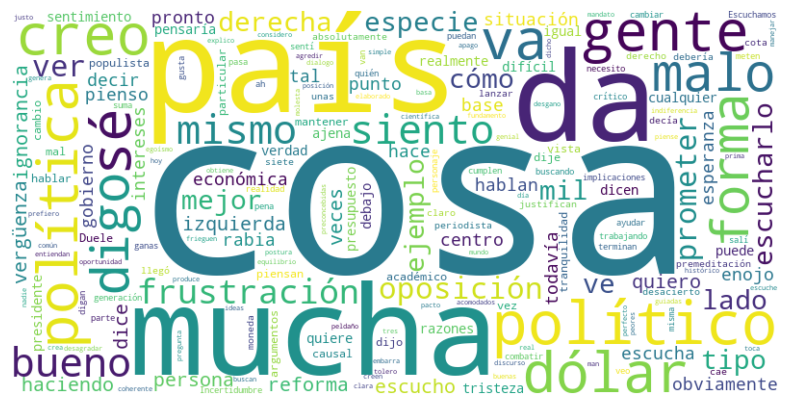

Creando wordcloud para la columna P14


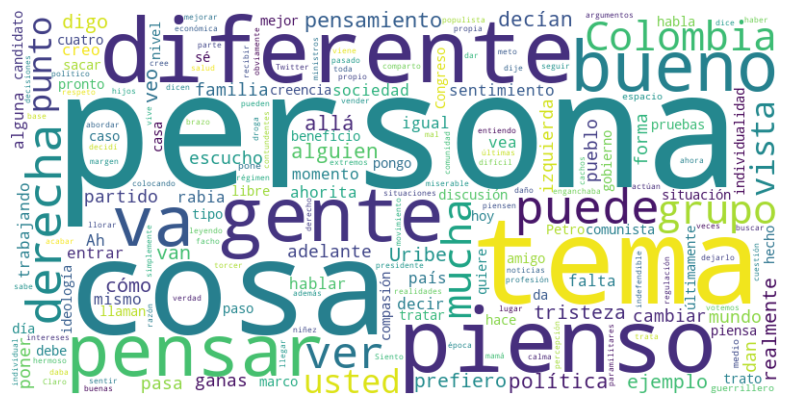

Creando wordcloud para la columna P15


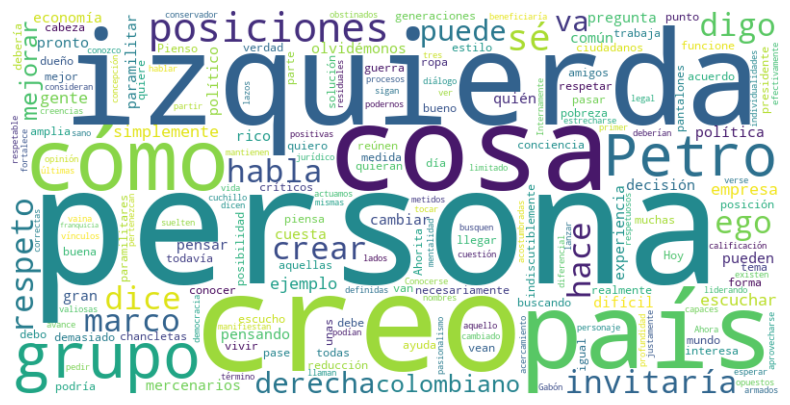

Creando wordcloud para la columna P16


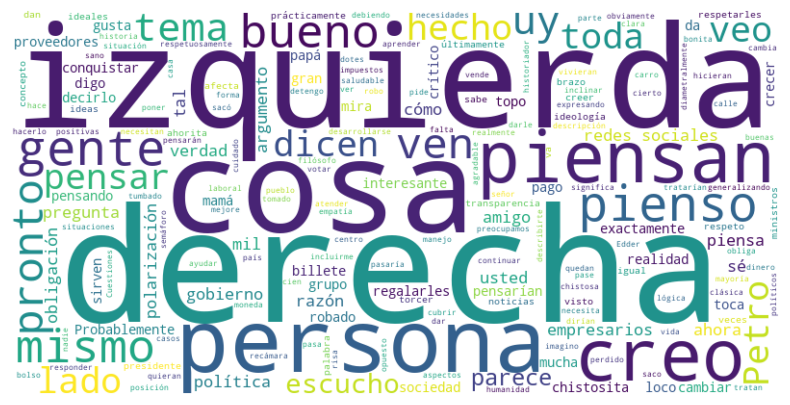

Creando wordcloud para la columna P17


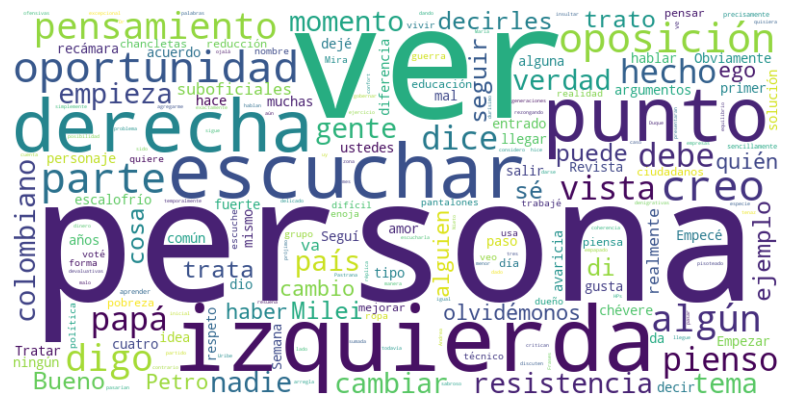

Creando wordcloud para la columna P18


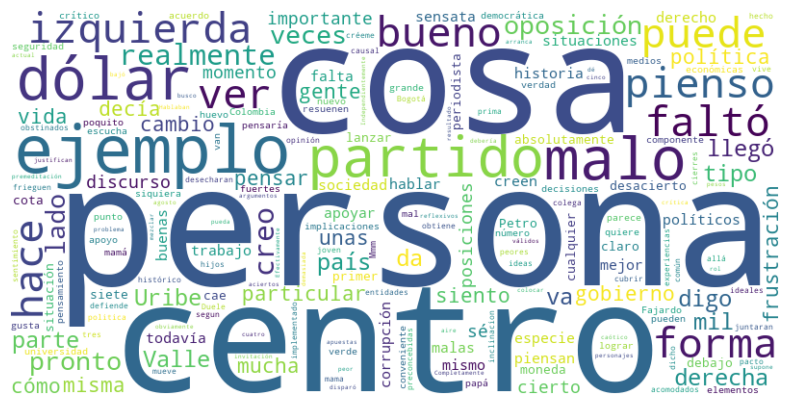

Creando wordcloud para la columna P20


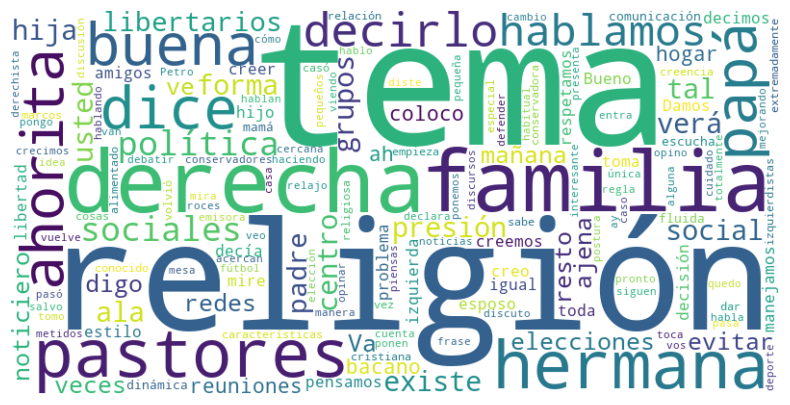

Creando wordcloud para la columna P21


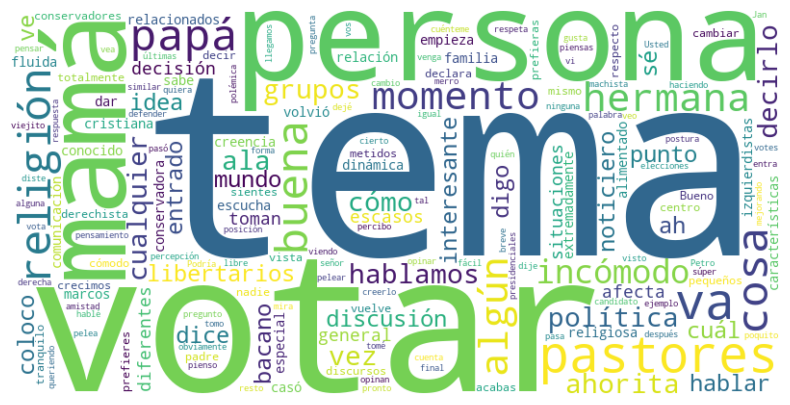

Creando wordcloud para la columna P22


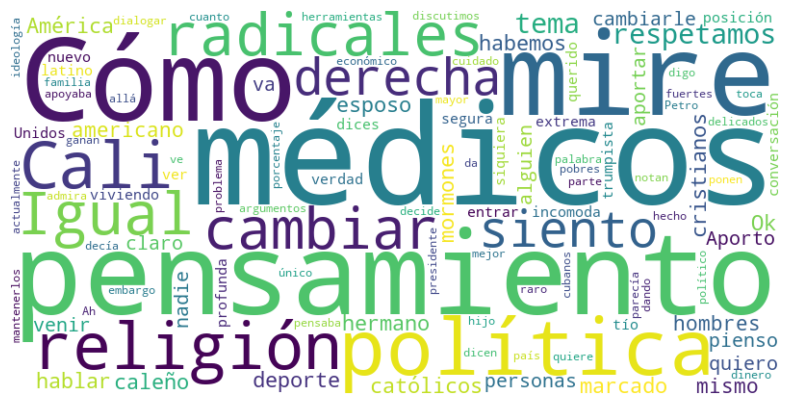

Creando wordcloud para la columna P25


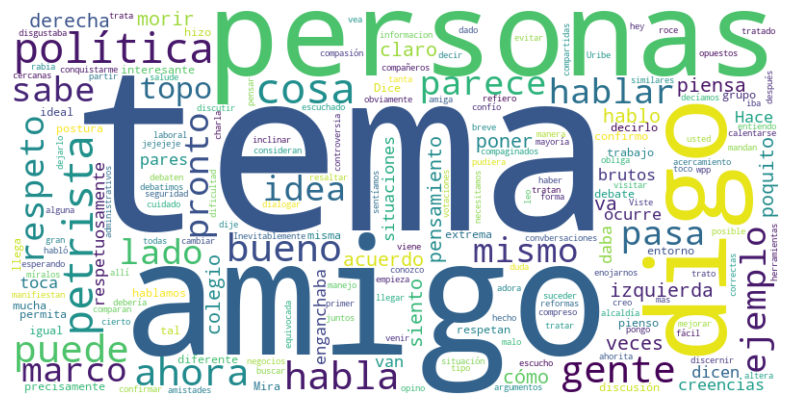

Creando wordcloud para la columna P26


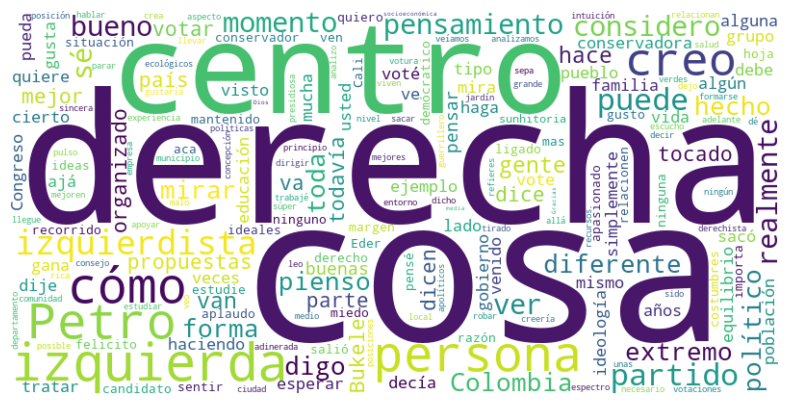

Creando wordcloud para la columna P27


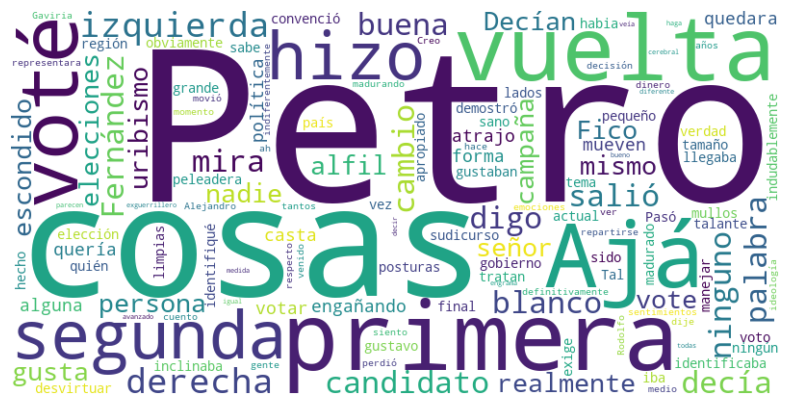

Creando wordcloud para la columna P28


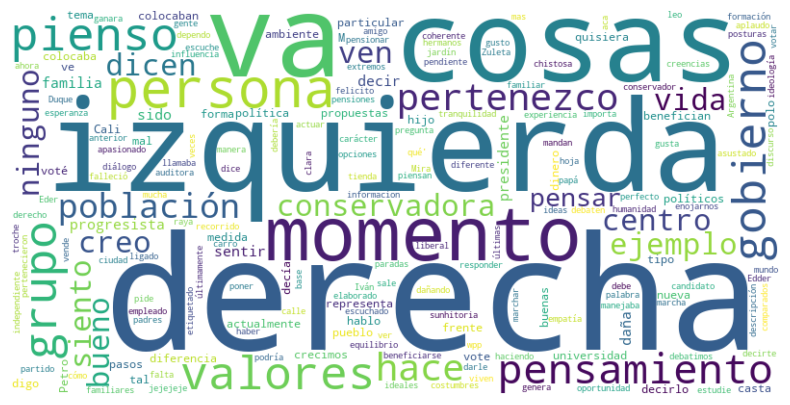

Creando wordcloud para la columna P31


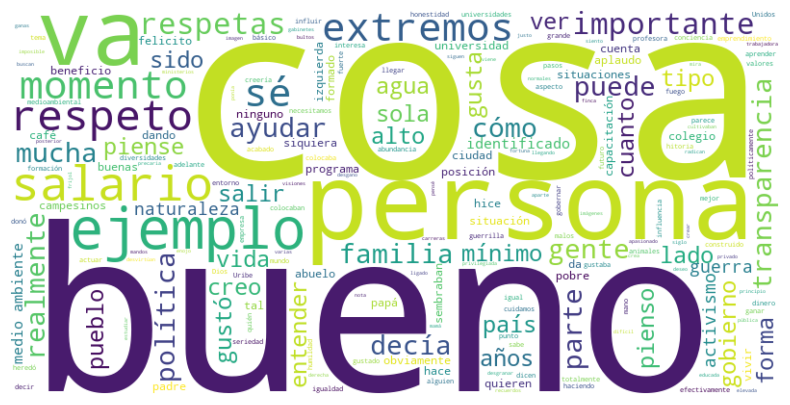

Creando wordcloud para la columna P32


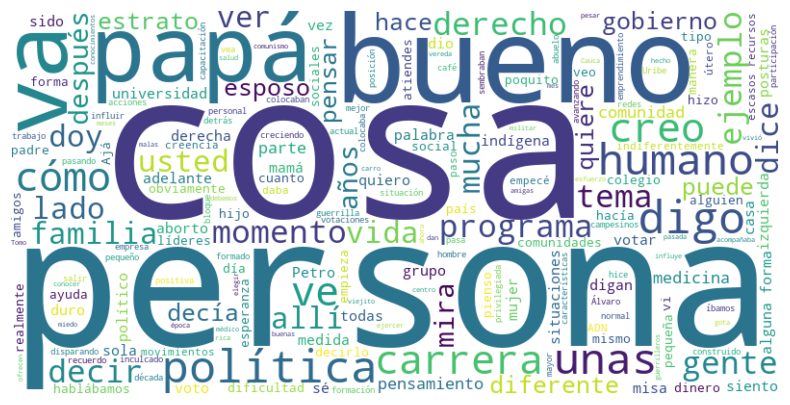

Creando wordcloud para la columna P33


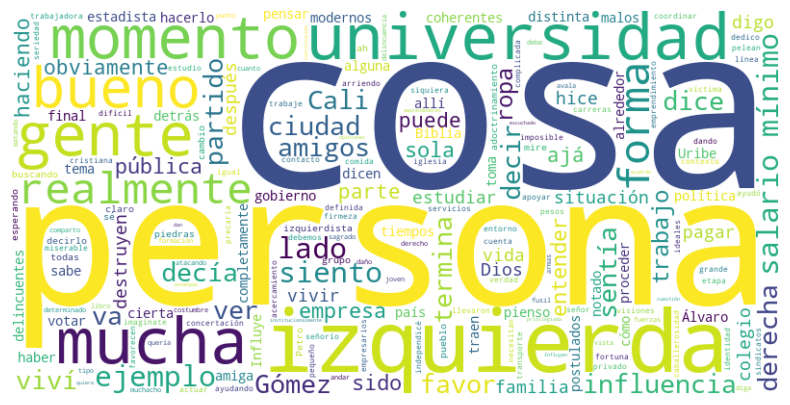

Creando wordcloud para la columna P34


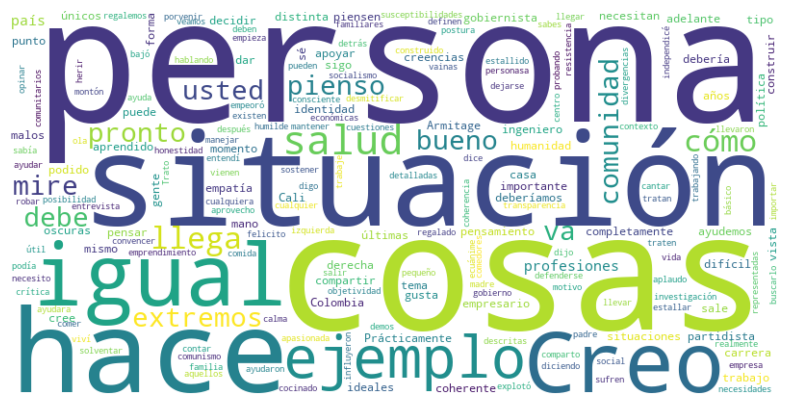

Creando wordcloud para la columna P35


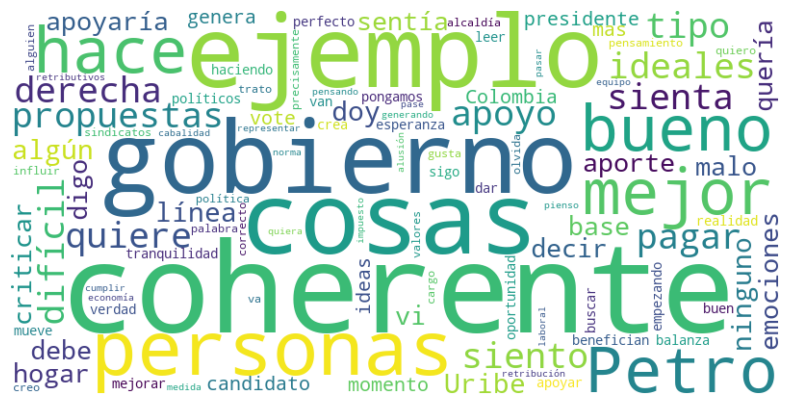

Creando wordcloud para la columna P36


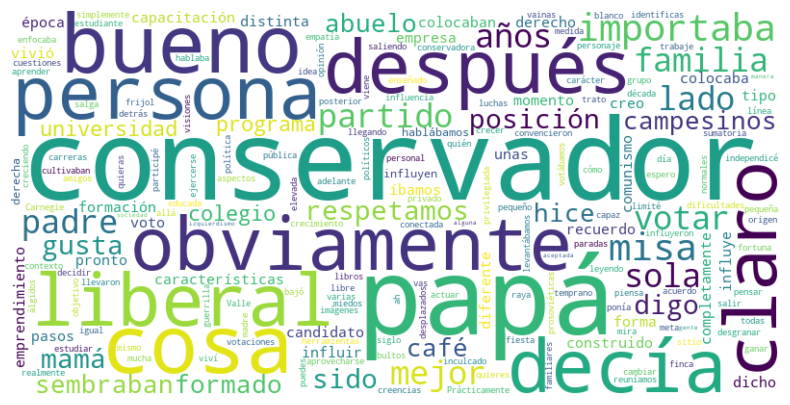

Creando wordcloud para la columna P39


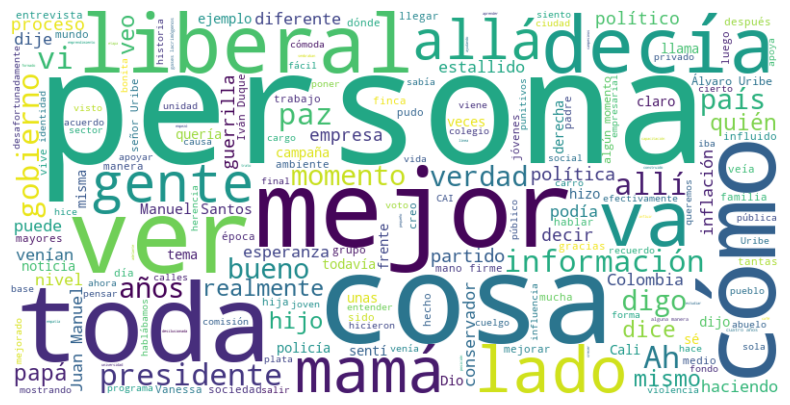

Creando wordcloud para la columna P40


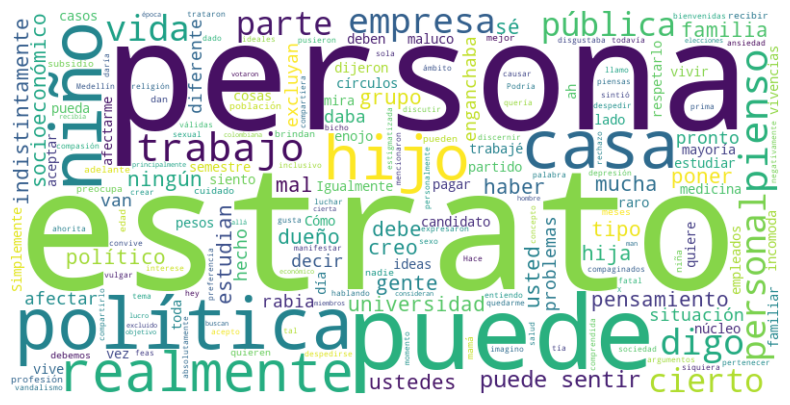

Creando wordcloud para la columna P41


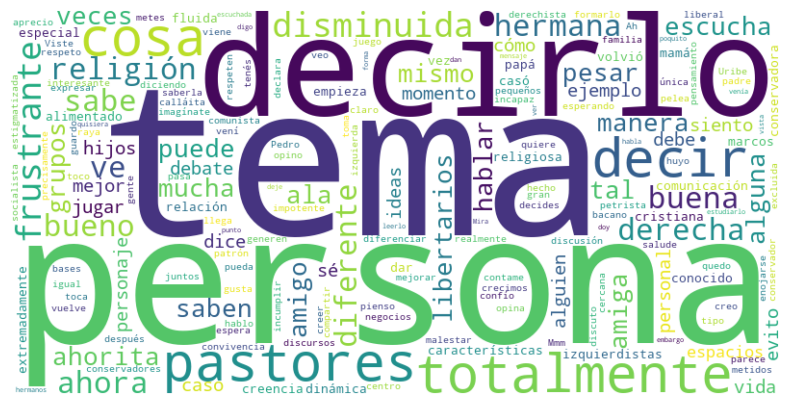

Creando wordcloud para la columna P42


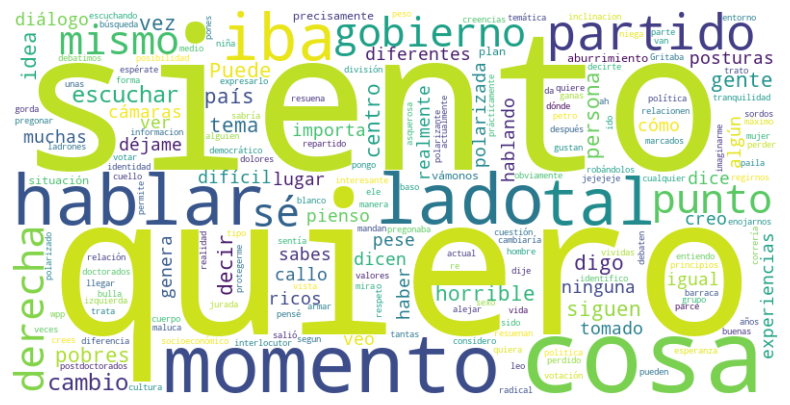

Creando wordcloud para la columna P43


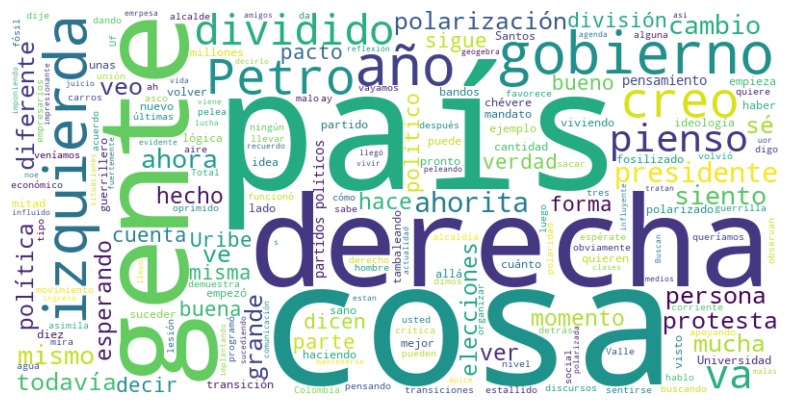

In [13]:
palabras_excluidas = ["pues","entonces","digamos","eh","a", "acá", "ahí", "al", "algo", "ambos", "ante", "antes", "aquel", "aquí", "arriba", "así", "atrás", "aun", "aunque", "bajo", "bastante", "bien", "cabe", "cada", "casi", "como", "con", "conmigo", "conseguimos", "conseguir", "consigo", "consigue", "consiguen", "consigues", "contigo", "contra", "cual", "cuales", "cuan", "cuando", "de", "dejar", "del", "demás", "dentro", "desde", "donde", "dos", "el", "él", "empleáis", "emplean", "emplear", "empleas", "empleo", "en", "encima", "entonces", "entre", "eramos", "eran", "eres", "es", "estaba", "estado", "estáis", "estamos", "están", "estar", "estoy", "etc", "fin", "fue", "fueron", "fui", "fuimos", "gueno", "ha", "hacéis", "hacemos", "hacen", "hacer", "hacia", "hago", "hasta", "incluso", "intentáis", "intentamos", "intentan", "intentar", "intento", "ir", "jamás", "largo", "más", "me", "menos", "mientras", "modo", "muy", "nada", "ni", "no", "nos", "nunca", "para", "parecer", "pero", "podéis", "podemos", "poder", "podríais", "podríamos", "podrían", "por", "por qué", "porque", "primero", "puedo", "pues", "que", "qué", "querer", "quienesquiera", "quienquiera", "sabéis", "sabemos", "saber", "se", "según", "ser", "si", "sí", "siempre", "siendo", "sin", "sino", "so", "sobre", "sois", "solamente", "solo", "sólo", "somos", "soy", "sr", "sra", "sres", "sta", "también", "tampoco", "tan", "te", "tenéis", "tenemos", "tener", "tengo", "ti", "tiempo", "tiene", "tienen", "tomar", "trabajáis", "trabajamos", "trabajan", "trabajar", "trabajas", "tras", "tú", "tu", "tus", "último", "ultimo", "usáis", "usamos", "usan", "usar", "uso", "vais", "valor", "vamos", "vaya", "verdadera", "voy", "y", "ya", "yo"]
for col in lista:
    print(f"Creando wordcloud para la columna {col}")
    create_wordcloud(df, col, Path(images_folder), dpi=600, palabras_excluidas=palabras_excluidas)

In [14]:
nuevas = df['P3'].tolist()
nuevas = pd.Series(nuevas).dropna().tolist()
texto = ' '.join(nuevas)


In [15]:
colectiva = []
for col in lista:
    individual = df[col].tolist()
    individual = pd.Series(individual).dropna().tolist()
    texto = ' '.join(individual)
    colectiva.append(texto)

colectiva

['Total, total. Cada... Es evidente, y se siente en todo lado. Se mira por todo lado por las situaciones que se están viviendo, y los dos bandos están peleando fuertemente por mantenerse en el poder y tratan de hacer cosas buenas y malas, como te digo. Pero por hacer esas situaciones, vuelvo y te repito, se están llevando gente inocente que nada tiene que ver con eso, ni, mejor dicho, y en últimas son los que terminan padeciendo.\n ¿La polarización? En eso estamos desde hace más de diez años. Desde el gobierno Santos Hay unas recámaras que resuenan con una información. Y el oído del individuo se pega a la recámara que se mueve o que vibra en sintonía con alguna cuestión, creencia o algo así. Estas cuestiones de la política están muy vinculadas en términos de las creencias.Estas cuestiones de la política están muy vinculadas en términos de las creencias. no, está muy polarizado y yo en lo que en lo que llevo pues de de vida en los 58 años nunca había visto cosas como la que he visto aho

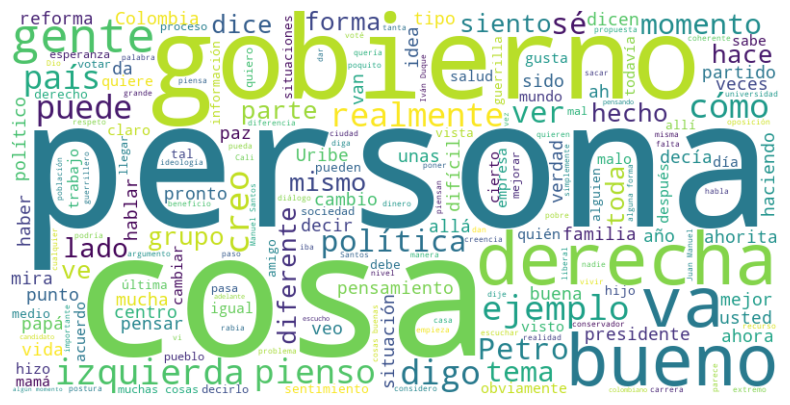

In [16]:
spanish_stopwords = stopwords.words('spanish')
# Add additional excluded words
if palabras_excluidas:
    spanish_stopwords.extend(palabras_excluidas)
# Convert the column values to a single text
text = ' '.join(colectiva)
# Create the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white')
# Add the stopwords to the WordCloud
wordcloud.stopwords.update(spanish_stopwords)
wordcloud.generate(text)
# Save the word cloud image
output_file = Path(images_folder) / f'wordcloud_global.png'
wordcloud.to_image().save(str(output_file), format='png', dpi=(600, 600))
# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [17]:
# Obtener las frecuencias de las palabras
frequencies = wordcloud.words_

# Ordenar las palabras por frecuencia y obtener las 10 más frecuentes
top_10_words = Counter(frequencies).most_common(10)

# Guardar las 10 palabras más frecuentes en un archivo de texto
output_file_txt = Path(images_folder) / f'wordcloud_global_top_10_words.txt'
with open(output_file_txt, 'w', encoding='utf-8') as file:
    file.write("Top 10 palabras más frecuentes en la nube de palabras:\n")
    for word, frequency in top_10_words:
        file.write(f"{word}: {frequency}\n")

# Embeddings.

In [18]:
embeddings = df['P3'].tolist()
embeddings = pd.Series(embeddings).dropna().tolist()
embeddings

['Total, total. Cada... Es evidente, y se siente en todo lado. Se mira por todo lado por las situaciones que se están viviendo, y los dos bandos están peleando fuertemente por mantenerse en el poder y tratan de hacer cosas buenas y malas, como te digo. Pero por hacer esas situaciones, vuelvo y te repito, se están llevando gente inocente que nada tiene que ver con eso, ni, mejor dicho, y en últimas son los que terminan padeciendo.\n',
 '¿La polarización? En eso estamos desde hace más de diez años. Desde el gobierno Santos',
 'Hay unas recámaras que resuenan con una información. Y el oído del individuo se pega a la recámara que se mueve o que vibra en sintonía con alguna cuestión, creencia o algo así. Estas cuestiones de la política están muy vinculadas en términos de las creencias.Estas cuestiones de la política están muy vinculadas en términos de las creencias.',
 'no, está muy polarizado y yo en lo que en lo que llevo pues de de vida en los 58 años nunca había visto cosas como la que 

In [19]:
df.head()

,NOMBRE,P3,Prediccion a la pregunta P3,Subcategoria a la pregunta P3,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P3,P4,Prediccion a la pregunta P4,Subcategoria a la pregunta P4,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P4,P5,...,Subcategoria a la pregunta P41,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P41,P42,Prediccion a la pregunta P42,Subcategoria a la pregunta P42,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P42,P43,Prediccion a la pregunta P43,Subcategoria a la pregunta P43,Subsubcategoria (IDENTIDAD SOCIAL) a la pregunta P43
0,Brandon Santos,"Total, total. Cada... Es evidente, y se siente...",POLARIZACIÓN,NaN,NaN,"Bueno, pues, ¿qué considero yo? Hombre, la pol...",POLARIZACIÓN,NaN,NaN,"""Hombre, la política está muy polarizada hoy e...",...,NaN,NaN,NaN,NINGUNA,NaN,NaN,"No, obviamente en el de Uribe. Pero en la actu...",POLARIZACIÓN,NaN,NaN
1,Michael Patton,¿La polarización? En eso estamos desde hace má...,POLARIZACIÓN,NaN,NaN,En eso estamos desde hace más de diez años. De...,POLARIZACIÓN,NaN,NaN,NaN,...,NaN,NaN,NaN,NINGUNA,NaN,NaN,¿La polarización? En eso estamos desde hace má...,POLARIZACIÓN,NaN,NaN
2,Dennis Kennedy,NaN,NINGUNA,NaN,NaN,"En estos gobiernos que has mencionado, ¿cómo m...",EMOCIONES POLÍTICAS,PRIMARIA,NaN,en este oportunidad si escuche un discurso y d...,...,NaN,NaN,"No me considero de ninguna, pues en algún mome...",IDENTIDAD,INDIVIDUAL,NaN,"no, para nada, eso es lo que nos quieren hacer...",POLARIZACIÓN,NaN,NaN
3,Wanda Gray,Hay unas recámaras que resuenan con una inform...,POLARIZACIÓN,NaN,NaN,"La salud más bien mal. Bueno, más bien no se h...",EMOCIONES POLÍTICAS,PRIMARIA,NaN,NaN,...,SOCIAL,REAL,Es difícil llegar a un punto medio otra vez. P...,POLARIZACIÓN,NaN,NaN,Y es impresionante la cantidad de personas que...,POLARIZACIÓN,NaN,NaN
4,Anna Roy,"no, está muy polarizado y yo en lo que en lo q...",POLARIZACIÓN,NaN,NaN,NaN,NINGUNA,NaN,NaN,"Yo sería partidario, como le digo, de que ese ...",...,SOCIAL,REAL,NaN,NINGUNA,NaN,NaN,está muy polarizado y yo en lo que en lo que l...,POLARIZACIÓN,NaN,NaN


In [20]:
lista

['P3',
 'P4',
 'P5',
 'P6',
 'P7',
 'P8',
 'P11',
 'P12',
 'P13',
 'P14',
 'P15',
 'P16',
 'P17',
 'P18',
 'P20',
 'P21',
 'P22',
 'P25',
 'P26',
 'P27',
 'P28',
 'P31',
 'P32',
 'P33',
 'P34',
 'P35',
 'P36',
 'P39',
 'P40',
 'P41',
 'P42',
 'P43']